In [1]:
# @title Pip install GraphCast
%pip install --upgrade https://github.com/deepmind/graphcast/archive/master.zip

     \ 1.7 MB 20.0 MB/s 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 123.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.3/172.3 kB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.3/374.3 kB 35.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.6/90.6 kB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 737.0/737.0 kB 74.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 306.8/306.8 kB 32.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.1/284.1 kB 28.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 110.7 MB/s eta 0:00:00
  Created wheel for graphcast: filename=graphcast-0.2.0.dev0-py3-none-any.whl size=136678 sha256=76a5a1990fc0fb388726708d0a98d81c95baae9093667d3ff75afd90021e4a54
  Stored in directory: /tmp/pip-ephem-wheel-cache-x6hjecds/wheels/f8/24/3a/f3b9883697c09258da804997b0ec6bf51dd1918f9c61add0

In [2]:
!pip uninstall -y shapely
!pip install shapely --no-binary shapely

Found existing installation: shapely 2.1.2
Uninstalling shapely-2.1.2:
  Successfully uninstalled shapely-2.1.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.5/315.5 kB 23.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for shapely: filename=shapely-2.1.2-cp312-cp312-linux_x86_64.whl size=1272414 sha256=46551869376c6e589eff2e597d2cde7cc604f30535ee03253f2d1870544b9f5c
  Stored in directory: /root/.cache/pip/wheels/e9/38/c7/6f4f8e2dc4abc29e31467a46546a15559efb2b735ab460b46d
Successfully built shapely


In [2]:
#@title Imports
import dataclasses
import datetime
import functools
import math
import re
from typing import Optional

import cartopy.crs as ccrs
from google.cloud import storage
from graphcast import autoregressive
from graphcast import casting
from graphcast import checkpoint
from graphcast import data_utils
from graphcast import graphcast
from graphcast import normalization
from graphcast import rollout
from graphcast import xarray_jax
from graphcast import xarray_tree
from IPython.display import HTML
import ipywidgets as widgets
import haiku as hk
import jax
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import animation
import numpy as np
import xarray


def parse_file_parts(file_name):
  return dict(part.split("-", 1) for part in file_name.split("_"))


In [3]:
# @title Authenticate with Google Cloud Storage
gcs_client = storage.Client.create_anonymous_client()
gcs_bucket = gcs_client.get_bucket("dm_graphcast")
dir_prefix = "graphcast/"

In [4]:
# @title Plotting functions
def select(
    data: xarray.Dataset,
    variable: str,
    level: Optional[int] = None,
    max_steps: Optional[int] = None
    ) -> xarray.Dataset:
  data = data[variable]
  if "batch" in data.dims:
    data = data.isel(batch=0)
  if max_steps is not None and "time" in data.sizes and max_steps < data.sizes["time"]:
    data = data.isel(time=range(0, max_steps))
  if level is not None and "level" in data.coords:
    data = data.sel(level=level)
  return data

def scale(
    data: xarray.Dataset,
    center: Optional[float] = None,
    robust: bool = False,
    ) -> tuple[xarray.Dataset, matplotlib.colors.Normalize, str]:
  vmin = np.nanpercentile(data, (2 if robust else 0))
  vmax = np.nanpercentile(data, (98 if robust else 100))
  if center is not None:
    diff = max(vmax - center, center - vmin)
    vmin = center - diff
    vmax = center + diff
  return (data, matplotlib.colors.Normalize(vmin, vmax),
          ("RdBu_r" if center is not None else "viridis"))

def plot_data(
    data: dict[str, xarray.Dataset],
    fig_title: str,
    plot_size: float = 5,
    robust: bool = False,
    cols: int = 4
    ) -> tuple[xarray.Dataset, matplotlib.colors.Normalize, str]:

  first_data = next(iter(data.values()))[0]
  max_steps = first_data.sizes.get("time", 1)
  assert all(max_steps == d.sizes.get("time", 1) for d, _, _ in data.values())

  cols = min(cols, len(data))
  rows = math.ceil(len(data) / cols)
  figure = plt.figure(figsize=(plot_size * 2 * cols,
                               plot_size * rows))
  figure.suptitle(fig_title, fontsize=16)
  figure.subplots_adjust(wspace=0, hspace=0)
  figure.tight_layout()

  images = []
  for i, (title, (plot_data, norm, cmap)) in enumerate(data.items()):
    ax = figure.add_subplot(rows, cols, i+1)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(title)
    im = ax.imshow(
        plot_data.isel(time=0, missing_dims="ignore"), norm=norm,
        origin="lower", cmap=cmap)
    plt.colorbar(
        mappable=im,
        ax=ax,
        orientation="vertical",
        pad=0.02,
        aspect=16,
        shrink=0.75,
        cmap=cmap,
        extend=("both" if robust else "neither"))
    images.append(im)

  def update(frame):
    if "time" in first_data.dims:
      td = datetime.timedelta(microseconds=first_data["time"][frame].item() / 1000)
      figure.suptitle(f"{fig_title}, {td}", fontsize=16)
    else:
      figure.suptitle(fig_title, fontsize=16)
    for im, (plot_data, norm, cmap) in zip(images, data.values()):
      im.set_data(plot_data.isel(time=frame, missing_dims="ignore"))

  ani = animation.FuncAnimation(
      fig=figure, func=update, frames=max_steps, interval=250)
  plt.close(figure.number)
  return HTML(ani.to_jshtml())

In [5]:
# @title Load model params

params_file_options = [
    name for blob in gcs_bucket.list_blobs(prefix=dir_prefix+"params/")
    if (name := blob.name.removeprefix(dir_prefix+"params/"))]  # Drop empty string.

random_mesh_size = widgets.IntSlider(
    value=4, min=4, max=6, description="Mesh size:")
random_gnn_msg_steps = widgets.IntSlider(
    value=4, min=1, max=32, description="GNN message steps:")
random_latent_size = widgets.Dropdown(
    options=[int(2**i) for i in range(4, 10)], value=32,description="Latent size:")
random_levels = widgets.Dropdown(
    options=[13, 37], value=13, description="Pressure levels:")


params_file = widgets.Dropdown(
    options=params_file_options,
    description="Params file:",
    layout={"width": "max-content"})

source_tab = widgets.Tab([
    widgets.VBox([
        random_mesh_size,
        random_gnn_msg_steps,
        random_latent_size,
        random_levels,
    ]),
    params_file,
])
source_tab.set_title(0, "Random")
source_tab.set_title(1, "Checkpoint")
widgets.VBox([
    source_tab,
    widgets.Label(value="Run the next cell to load the model. Rerunning this cell clears your selection.")
])


In [6]:
# @title Loading the model
source = source_tab.get_title(source_tab.selected_index)

if source == "Random":
  params = None  # Filled in below
  state = {}
  model_config = graphcast.ModelConfig(
      resolution=0,
      mesh_size=random_mesh_size.value,
      latent_size=random_latent_size.value,
      gnn_msg_steps=random_gnn_msg_steps.value,
      hidden_layers=1,
      radius_query_fraction_edge_length=0.6)
  task_config = graphcast.TaskConfig(
      input_variables=graphcast.TASK.input_variables,
      target_variables=graphcast.TASK.target_variables,
      forcing_variables=graphcast.TASK.forcing_variables,
      pressure_levels=graphcast.PRESSURE_LEVELS[random_levels.value],
      input_duration=graphcast.TASK.input_duration,
  )
else:
  assert source == "Checkpoint"
  with gcs_bucket.blob(f"{dir_prefix}params/{params_file.value}").open("rb") as f:
    ckpt = checkpoint.load(f, graphcast.CheckPoint)
  params = ckpt.params
  state = {}

  model_config = ckpt.model_config
  task_config = ckpt.task_config
  print("Model description:\n", ckpt.description, "\n")
  print("Model license:\n", ckpt.license, "\n")

model_config

ModelConfig(resolution=0, mesh_size=4, latent_size=32, gnn_msg_steps=4, hidden_layers=1, radius_query_fraction_edge_length=0.6, mesh2grid_edge_normalization_factor=None)

In [7]:
# @title Get and filter the list of available example datasets

dataset_file_options = [
    name for blob in gcs_bucket.list_blobs(prefix=dir_prefix+"dataset/")
    if (name := blob.name.removeprefix(dir_prefix+"dataset/"))]  # Drop empty string.

def data_valid_for_model(
    file_name: str, model_config: graphcast.ModelConfig, task_config: graphcast.TaskConfig):
  file_parts = parse_file_parts(file_name.removesuffix(".nc"))
  return (
      model_config.resolution in (0, float(file_parts["res"])) and
      len(task_config.pressure_levels) == int(file_parts["levels"]) and
      (
          ("total_precipitation_6hr" in task_config.input_variables and
           file_parts["source"] in ("era5", "fake")) or
          ("total_precipitation_6hr" not in task_config.input_variables and
           file_parts["source"] in ("hres", "fake"))
      )
  )


dataset_file = widgets.Dropdown(
    options=[
        (", ".join([f"{k}: {v}" for k, v in parse_file_parts(option.removesuffix(".nc")).items()]), option)
        for option in dataset_file_options
        if data_valid_for_model(option, model_config, task_config)
    ],
    description="Dataset file:",
    layout={"width": "max-content"})
widgets.VBox([
    dataset_file,
    widgets.Label(value="Run the next cell to load the dataset. Rerunning this cell clears your selection and refilters the datasets that match your model.")
])

For our project, we will be looking at 72 hour forecast, so select "source: era5, date: 2022-01-01, res: 0.25, levels: 13, steps: 12" from the dropdown menu above.

In [8]:
# @title Load weather data

if not data_valid_for_model(dataset_file.value, model_config, task_config):
  raise ValueError(
      "Invalid dataset file, rerun the cell above and choose a valid dataset file.")

with gcs_bucket.blob(f"{dir_prefix}dataset/{dataset_file.value}").open("rb") as f:
  example_batch = xarray.load_dataset(f).compute()

assert example_batch.dims["time"] >= 3  # 2 for input, >=1 for targets

print(", ".join([f"{k}: {v}" for k, v in parse_file_parts(dataset_file.value.removesuffix(".nc")).items()]))

example_batch

/tmp/ipython-input-1148450288.py:8: FutureWarning: In a future version, xarray will not decode the variable 'time' into a timedelta64 dtype based on the presence of a timedelta-like 'units' attribute by default. Instead it will rely on the presence of a timedelta64 'dtype' attribute, which is now xarray's default way of encoding timedelta64 values.
To continue decoding into a timedelta64 dtype, either set `decode_timedelta=True` when opening this dataset, or add the attribute `dtype='timedelta64[ns]'` to this variable on disk.
To opt-in to future behavior, set `decode_timedelta=False`.
  example_batch = xarray.load_dataset(f).compute()


source: era5, date: 2022-01-01, res: 0.25, levels: 13, steps: 12


/tmp/ipython-input-1148450288.py:10: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  assert example_batch.dims["time"] >= 3  # 2 for input, >=1 for targets


<xarray.Dataset> Size: 5GB
Dimensions:                       (lat: 721, lon: 1440, batch: 1, time: 14,
                                   level: 13)
Coordinates:
  * lat                           (lat) float32 3kB -90.0 -89.75 ... 89.75 90.0
  * lon                           (lon) float32 6kB 0.0 0.25 0.5 ... 359.5 359.8
  * time                          (time) timedelta64[ns] 112B 0 days 00:00:00...
  * level                         (level) int32 52B 50 100 150 ... 850 925 1000
    datetime                      (batch, time) datetime64[ns] 112B 2022-01-0...
Dimensions without coordinates: batch
Data variables: (12/14)
    geopotential_at_surface       (lat, lon) float32 4MB 2.735e+04 ... -0.07617
    land_sea_mask                 (lat, lon) float32 4MB 1.0 1.0 1.0 ... 0.0 0.0
    2m_temperature                (batch, time, lat, lon) float32 58MB 250.7 ...
    mean_sea_level_pressure       (batch, time, lat, lon) float32 58MB 9.931e...
    10m_v_component_of_wind       (batch, time, lat, lon) float32 58MB -0.439...
    10m_u_component_of_wind       (batch, time, lat, lon) float32 58MB 1.309 ...
    ...                            ...
    temperature                   (batch, time, level, lat, lon) float32 756MB ...
    geopotential                  (batch, time, level, lat, lon) float32 756MB ...
    u_component_of_wind           (batch, time, level, lat, lon) float32 756MB ...
    v_component_of_wind           (batch, time, level, lat, lon) float32 756MB ...
    vertical_velocity             (batch, time, level, lat, lon) float32 756MB ...
    specific_humidity             (batch, time, level, lat, lon) float32 756MB ...

In [9]:
# @title Choose data to plot

plot_example_variable = widgets.Dropdown(
    options=example_batch.data_vars.keys(),
    value="2m_temperature",
    description="Variable")
plot_example_level = widgets.Dropdown(
    options=example_batch.coords["level"].values,
    value=500,
    description="Level")
plot_example_robust = widgets.Checkbox(value=True, description="Robust")
plot_example_max_steps = widgets.IntSlider(
    min=1, max=example_batch.dims["time"], value=example_batch.dims["time"],
    description="Max steps")

widgets.VBox([
    plot_example_variable,
    plot_example_level,
    plot_example_robust,
    plot_example_max_steps,
    widgets.Label(value="Run the next cell to plot the data. Rerunning this cell clears your selection.")
])

/tmp/ipython-input-2987701864.py:13: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  min=1, max=example_batch.dims["time"], value=example_batch.dims["time"],


Choose 2m_temperature from Variable dropdown.

In [11]:

plot_size = 7

data = {
    " ": scale(select(example_batch, plot_example_variable.value, plot_example_level.value, plot_example_max_steps.value),
              robust=plot_example_robust.value),
}
fig_title = plot_example_variable.value
if "level" in example_batch[plot_example_variable.value].coords:
  fig_title += f" at {plot_example_level.value} hPa"

plot_data(data, fig_title, plot_size, plot_example_robust.value)

In [10]:
# @title Choose training and eval data to extract

train_steps = widgets.IntSlider(
    value=1, min=1, max=example_batch.sizes["time"]-2, description="Train steps")
eval_steps = widgets.IntSlider(
    value=example_batch.sizes["time"]-2, min=1, max=example_batch.sizes["time"]-2, description="Eval steps")

widgets.VBox([
    train_steps,
    eval_steps,
    widgets.Label(value="Run the next cell to extract the data. Rerunning this cell clears your selection.")
])

In [11]:
# @title Extract training and evaluation data

train_inputs, train_targets, train_forcings = data_utils.extract_inputs_targets_forcings(
    example_batch, target_lead_times=slice("6h", f"{train_steps.value*6}h"),
    **dataclasses.asdict(task_config))

eval_inputs, eval_targets, eval_forcings = data_utils.extract_inputs_targets_forcings(
    example_batch, target_lead_times=slice("6h", f"{eval_steps.value*6}h"),
    **dataclasses.asdict(task_config))

print("All Examples:  ", example_batch.dims.mapping)
print("Train Inputs:  ", train_inputs.dims.mapping)
print("Train Targets: ", train_targets.dims.mapping)
print("Train Forcings:", train_forcings.dims.mapping)
print("Eval Inputs:   ", eval_inputs.dims.mapping)
print("Eval Targets:  ", eval_targets.dims.mapping)
print("Eval Forcings: ", eval_forcings.dims.mapping)

All Examples:   {'lat': 721, 'lon': 1440, 'batch': 1, 'time': 14, 'level': 13}
Train Inputs:   {'batch': 1, 'time': 2, 'lat': 721, 'lon': 1440, 'level': 13}
Train Targets:  {'batch': 1, 'time': 1, 'lat': 721, 'lon': 1440, 'level': 13}
Train Forcings: {'batch': 1, 'time': 1, 'lat': 721, 'lon': 1440}
Eval Inputs:    {'batch': 1, 'time': 2, 'lat': 721, 'lon': 1440, 'level': 13}
Eval Targets:   {'batch': 1, 'time': 12, 'lat': 721, 'lon': 1440, 'level': 13}
Eval Forcings:  {'batch': 1, 'time': 12, 'lat': 721, 'lon': 1440}


In [12]:
# @title Load normalization data

with gcs_bucket.blob(dir_prefix+"stats/diffs_stddev_by_level.nc").open("rb") as f:
  diffs_stddev_by_level = xarray.load_dataset(f).compute()
with gcs_bucket.blob(dir_prefix+"stats/mean_by_level.nc").open("rb") as f:
  mean_by_level = xarray.load_dataset(f).compute()
with gcs_bucket.blob(dir_prefix+"stats/stddev_by_level.nc").open("rb") as f:
  stddev_by_level = xarray.load_dataset(f).compute()

In [13]:
# @title Build jitted functions, and possibly initialize random weights

def construct_wrapped_graphcast(
    model_config: graphcast.ModelConfig,
    task_config: graphcast.TaskConfig):
  """Constructs and wraps the GraphCast Predictor."""
  # Deeper one-step predictor.
  predictor = graphcast.GraphCast(model_config, task_config)

  # Modify inputs/outputs to `graphcast.GraphCast` to handle conversion to
  # from/to float32 to/from BFloat16.
  predictor = casting.Bfloat16Cast(predictor)

  # Modify inputs/outputs to `casting.Bfloat16Cast` so the casting to/from
  # BFloat16 happens after applying normalization to the inputs/targets.
  predictor = normalization.InputsAndResiduals(
      predictor,
      diffs_stddev_by_level=diffs_stddev_by_level,
      mean_by_level=mean_by_level,
      stddev_by_level=stddev_by_level)

  # Wraps everything so the one-step model can produce trajectories.
  predictor = autoregressive.Predictor(predictor, gradient_checkpointing=True)
  return predictor


@hk.transform_with_state
def run_forward(model_config, task_config, inputs, targets_template, forcings):
  predictor = construct_wrapped_graphcast(model_config, task_config)
  return predictor(inputs, targets_template=targets_template, forcings=forcings)


@hk.transform_with_state
def loss_fn(model_config, task_config, inputs, targets, forcings):
  predictor = construct_wrapped_graphcast(model_config, task_config)
  loss, diagnostics = predictor.loss(inputs, targets, forcings)
  return xarray_tree.map_structure(
      lambda x: xarray_jax.unwrap_data(x.mean(), require_jax=True),
      (loss, diagnostics))

def grads_fn(params, state, model_config, task_config, inputs, targets, forcings):
  def _aux(params, state, i, t, f):
    (loss, diagnostics), next_state = loss_fn.apply(
        params, state, jax.random.PRNGKey(0), model_config, task_config,
        i, t, f)
    return loss, (diagnostics, next_state)
  (loss, (diagnostics, next_state)), grads = jax.value_and_grad(
      _aux, has_aux=True)(params, state, inputs, targets, forcings)
  return loss, diagnostics, next_state, grads

# Jax doesn't seem to like passing configs as args through the jit. Passing it
# in via partial (instead of capture by closure) forces jax to invalidate the
# jit cache if you change configs.
def with_configs(fn):
  return functools.partial(
      fn, model_config=model_config, task_config=task_config)

# Always pass params and state, so the usage below are simpler
def with_params(fn):
  return functools.partial(fn, params=params, state=state)

# Our models aren't stateful, so the state is always empty, so just return the
# predictions. This is requiredy by our rollout code, and generally simpler.
def drop_state(fn):
  return lambda **kw: fn(**kw)[0]

init_jitted = jax.jit(with_configs(run_forward.init))

if params is None:
  params, state = init_jitted(
      rng=jax.random.PRNGKey(0),
      inputs=train_inputs,
      targets_template=train_targets,
      forcings=train_forcings)

loss_fn_jitted = drop_state(with_params(jax.jit(with_configs(loss_fn.apply))))
grads_fn_jitted = with_params(jax.jit(with_configs(grads_fn)))
run_forward_jitted = drop_state(with_params(jax.jit(with_configs(
    run_forward.apply))))

/usr/local/lib/python3.12/dist-packages/graphcast/autoregressive.py:202: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  scan_length = targets_template.dims['time']
/usr/local/lib/python3.12/dist-packages/graphcast/autoregressive.py:115: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  num_inputs = inputs.dims['time']


# Running the Model

In [14]:
# @title Autoregressive rollout

assert model_config.resolution in (0, 360. / eval_inputs.sizes["lon"]), (
  "Model resolution doesn't match the data resolution. You likely want to "
  "re-filter the dataset list, and download the correct data.")

print("Inputs:  ", eval_inputs.dims.mapping)
print("Targets: ", eval_targets.dims.mapping)
print("Forcings:", eval_forcings.dims.mapping)

predictions = rollout.chunked_prediction(
    run_forward_jitted,
    rng=jax.random.PRNGKey(0),
    inputs=eval_inputs,
    targets_template=eval_targets * np.nan,
    forcings=eval_forcings)
predictions

Inputs:   {'batch': 1, 'time': 2, 'lat': 721, 'lon': 1440, 'level': 13}
Targets:  {'batch': 1, 'time': 12, 'lat': 721, 'lon': 1440, 'level': 13}
Forcings: {'batch': 1, 'time': 12, 'lat': 721, 'lon': 1440}


/usr/local/lib/python3.12/dist-packages/graphcast/rollout.py:295: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  num_target_steps = targets_template.dims["time"]
/usr/local/lib/python3.12/dist-packages/graphcast/autoregressive.py:202: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  scan_length = targets_template.dims['time']
/usr/local/lib/python3.12/dist-packages/graphcast/autoregressive.py:115: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension

<xarray.Dataset> Size: 4GB
Dimensions:                  (time: 12, batch: 1, lat: 721, lon: 1440, level: 13)
Coordinates:
  * time                     (time) timedelta64[ns] 96B 0 days 06:00:00 ... 3...
  * lat                      (lat) float32 3kB -90.0 -89.75 -89.5 ... 89.75 90.0
  * lon                      (lon) float32 6kB 0.0 0.25 0.5 ... 359.5 359.8
  * level                    (level) int32 52B 50 100 150 200 ... 850 925 1000
Dimensions without coordinates: batch
Data variables:
    10m_u_component_of_wind  (time, batch, lat, lon) float32 50MB 1.794 ... 2...
    10m_v_component_of_wind  (time, batch, lat, lon) float32 50MB -1.916 ... ...
    2m_temperature           (time, batch, lat, lon) float32 50MB 248.5 ... 2...
    geopotential             (time, batch, level, lat, lon) float32 648MB 1.9...
    mean_sea_level_pressure  (time, batch, lat, lon) float32 50MB 9.956e+04 ....
    specific_humidity        (time, batch, level, lat, lon) float32 648MB 2.9...
    temperature              (time, batch, level, lat, lon) float32 648MB 239...
    total_precipitation_6hr  (time, batch, lat, lon) float32 50MB 0.001246 .....
    u_component_of_wind      (time, batch, level, lat, lon) float32 648MB -3....
    v_component_of_wind      (time, batch, level, lat, lon) float32 648MB 7.6...
    vertical_velocity        (time, batch, level, lat, lon) float32 648MB 0.0...

In [ ]:
# @title Plotting Predictions
plot_pred_variable = widgets.Dropdown(
    options=predictions.data_vars.keys(),
    value="2m_temperature",
    description="Variable")
plot_pred_level = widgets.Dropdown(
    options=predictions.coords["level"].values,
    value=500,
    description="Level")
plot_pred_robust = widgets.Checkbox(value=True, description="Robust")
plot_pred_max_steps = widgets.IntSlider(
    min=1,
    max=predictions.dims["time"],
    value=predictions.dims["time"],
    description="Max steps")

widgets.VBox([
    plot_pred_variable,
    plot_pred_level,
    plot_pred_robust,
    plot_pred_max_steps,
    widgets.Label(value="Run the next cell to plot the predictions. Rerunning this cell clears your selection.")
])

/tmp/ipython-input-272387822.py:12: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  max=predictions.dims["time"],
/tmp/ipython-input-272387822.py:13: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  value=predictions.dims["time"],


In [ ]:
plot_size = 5
plot_max_steps = min(predictions.dims["time"], plot_pred_max_steps.value)

data = {
    "Targets": scale(select(eval_targets, plot_pred_variable.value, plot_pred_level.value, plot_max_steps), robust=plot_pred_robust.value),
    "Predictions": scale(select(predictions, plot_pred_variable.value, plot_pred_level.value, plot_max_steps), robust=plot_pred_robust.value),
    "Diff": scale((select(eval_targets, plot_pred_variable.value, plot_pred_level.value, plot_max_steps) -
                        select(predictions, plot_pred_variable.value, plot_pred_level.value, plot_max_steps)),
                       robust=plot_pred_robust.value, center=0),
}
fig_title = plot_pred_variable.value
if "level" in predictions[plot_pred_variable.value].coords:
  fig_title += f" at {plot_pred_level.value} hPa"

plot_data(data, fig_title, plot_size, plot_pred_robust.value)

/tmp/ipython-input-3380786640.py:2: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  plot_max_steps = min(predictions.dims["time"], plot_pred_max_steps.value)


EVALUATION METRICS

Total timesteps evaluated: 12
Spatial resolution: 1440x721


               Variable Level (hPa)        RMSE         MAE        Bias  Mean Prediction   Mean Target   Std Target
10m_u_component_of_wind     Surface   14.763255   11.080716   10.396132        10.073720     -0.320349     5.159807
10m_v_component_of_wind     Surface   16.292905   13.061791  -12.703197       -13.035650     -0.330387     4.461757
         2m_temperature     Surface    9.220230    6.748529    4.555411       263.618958    263.771851    24.116381
           geopotential          50 1047.576847  765.409180  423.992157    225144.828125 225051.062500 26005.355469
           geopotential         100  917.915948  667.363342 -266.737152    139361.953125 139319.921875 18850.277344
           geopotential         150 1458.141111 1104.203247 -956.462585    131339.062500 131445.125000  5739.557129
           geopotential         200 1384.939349  979.007996 -558.732849    125162.875000 125218.617188 1140

/tmp/ipython-input-2515754118.py:162: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  print(f"\nTotal timesteps evaluated: {predictions.dims['time']}")
/tmp/ipython-input-2515754118.py:163: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  print(f"Spatial resolution: {predictions.dims['lon']}x{predictions.dims['lat']}")


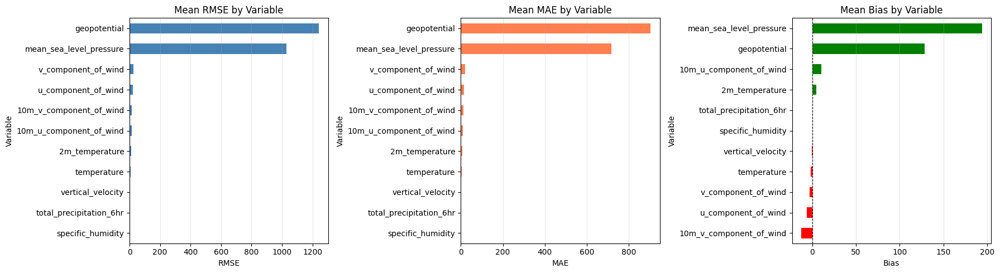


Plotting temporal metrics for 2m_temperature at 500 hPa


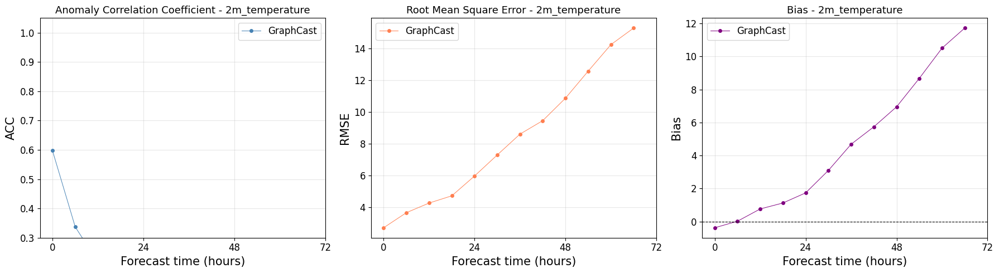


Metric values:
Initial ACC: 0.5972, Final ACC: 0.0429
Initial RMSE: 2.7101, Final RMSE: 15.2758
Initial Bias: -0.3757, Final Bias: 11.7283

Analyzing extreme values for 2m_temperature


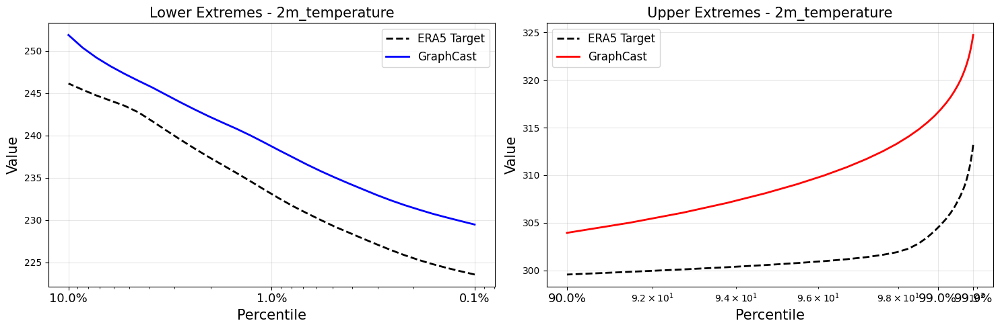


Extreme Value Statistics:
Mean absolute difference in lower extremes (0.1-10%): 5.2534
Mean absolute difference in upper extremes (90-99.9%): 10.5816

Target range: [223.57, 313.18]
Prediction range: [229.47, 324.74]


In [18]:
# @title Compute Evaluation Metrics (RMSE, MAE, Bias, and ACC)

import pandas as pd

def compute_metrics(predictions, targets, variables=None, levels=None):
    results = []

    # Select variables to evaluate
    vars_to_eval = variables if variables is not None else list(predictions.data_vars.keys())

    for var in vars_to_eval:
        if var not in predictions or var not in targets:
            continue

        pred_var = predictions[var]
        target_var = targets[var]

        # Check if variable has levels
        has_levels = 'level' in pred_var.coords

        if has_levels:
            levels_to_eval = levels if levels is not None else pred_var.coords['level'].values

            for level in levels_to_eval:
                if level not in pred_var.coords['level'].values:
                    continue

                pred_level = pred_var.sel(level=level)
                target_level = target_var.sel(level=level)

                # Compute metrics
                diff = pred_level - target_level
                rmse = float(np.sqrt((diff ** 2).mean()))
                mae = float(np.abs(diff).mean())
                bias = float(diff.mean())  # Added: Bias calculation

                results.append({
                    'Variable': var,
                    'Level (hPa)': level,
                    'RMSE': rmse,
                    'MAE': mae,
                    'Bias': bias,  # Added
                    'Mean Prediction': float(pred_level.mean()),  # Added
                    'Mean Target': float(target_level.mean()),
                    'Std Target': float(target_level.std())
                })
        else:
            # Surface variable without levels
            diff = pred_var - target_var
            rmse = float(np.sqrt((diff ** 2).mean()))
            mae = float(np.abs(diff).mean())
            bias = float(diff.mean())  # Added: Bias calculation

            results.append({
                'Variable': var,
                'Level (hPa)': 'Surface',
                'RMSE': rmse,
                'MAE': mae,
                'Bias': bias,  # Added
                'Mean Prediction': float(pred_var.mean()),  # Added
                'Mean Target': float(target_var.mean()),
                'Std Target': float(target_var.std())
            })

    return pd.DataFrame(results)


def compute_acc(predictions, targets, climatology_mean):
    pred_anom = predictions - climatology_mean
    target_anom = targets - climatology_mean

    # Flatten spatial dimensions
    pred_flat = pred_anom.values.reshape(pred_anom.shape[0], -1)
    target_flat = target_anom.values.reshape(target_anom.shape[0], -1)

    # Compute correlation for each timestep
    acc = np.zeros(pred_flat.shape[0])
    for t in range(pred_flat.shape[0]):
        numerator = np.sum(pred_flat[t] * target_flat[t])
        denominator = np.sqrt(np.sum(pred_flat[t]**2) * np.sum(target_flat[t]**2))
        acc[t] = numerator / denominator if denominator > 0 else 0

    return acc


def compute_temporal_metrics(predictions, targets, variable, level=None):
    pred_var = predictions[variable]
    target_var = targets[variable]

    if level is not None and 'level' in pred_var.coords:
        pred_var = pred_var.sel(level=level)
        target_var = target_var.sel(level=level)

    n_times = pred_var.sizes['time']
    rmse_time = np.zeros(n_times)
    acc_time = np.zeros(n_times)
    bias_time = np.zeros(n_times)  # Added: Temporal bias

    # Use mean as simple climatology approximation
    climatology = target_var.mean(dim='time')

    for t in range(n_times):
        pred_t = pred_var.isel(time=t)
        target_t = target_var.isel(time=t)

        # RMSE
        diff = pred_t - target_t
        rmse_time[t] = float(np.sqrt((diff ** 2).mean()))

        # Bias
        bias_time[t] = float(diff.mean())  # Added

        # ACC
        pred_anom = (pred_t - climatology).values.flatten()
        target_anom = (target_t - climatology).values.flatten()

        numerator = np.sum(pred_anom * target_anom)
        denominator = np.sqrt(np.sum(pred_anom**2) * np.sum(target_anom**2))
        acc_time[t] = numerator / denominator if denominator > 0 else 0

    return rmse_time, acc_time, bias_time  # Modified return


def compute_extreme_percentiles(predictions, targets, variable, level=None,
                                  n_percentiles=20, q_min=0.001, q_max=0.1):
    pred_var = predictions[variable]
    target_var = targets[variable]

    if level is not None and 'level' in pred_var.coords:
        pred_var = pred_var.sel(level=level)
        target_var = target_var.sel(level=level)

    # Create logarithmic percentile range focusing on extremes
    qtiles = np.logspace(np.log10(q_min), np.log10(q_max), num=n_percentiles)

    pred_values = pred_var.values.flatten()
    target_values = target_var.values.flatten()

    # Remove NaN values
    pred_values = pred_values[~np.isnan(pred_values)]
    target_values = target_values[~np.isnan(target_values)]

    # Compute percentiles for both lower and upper extremes
    lower_percentiles = qtiles * 100
    upper_percentiles = 100 - lower_percentiles

    pred_lower = np.percentile(pred_values, lower_percentiles)
    target_lower = np.percentile(target_values, lower_percentiles)
    pred_upper = np.percentile(pred_values, upper_percentiles)
    target_upper = np.percentile(target_values, upper_percentiles)

    return qtiles, pred_lower, target_lower, pred_upper, target_upper


# Compute metrics for all variables and levels
metrics_df = compute_metrics(predictions, eval_targets)

# Display overall metrics
print("=" * 80)
print("EVALUATION METRICS")
print("=" * 80)
print(f"\nTotal timesteps evaluated: {predictions.dims['time']}")
print(f"Spatial resolution: {predictions.dims['lon']}x{predictions.dims['lat']}")
print("\n")

# Display metrics table
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: f'{x:.6f}')
print(metrics_df.to_string(index=False))

# Compute and display summary statistics
print("\n" + "=" * 80)
print("SUMMARY BY VARIABLE")
print("=" * 80)
summary = metrics_df.groupby('Variable').agg({
    'RMSE': ['mean', 'std', 'min', 'max'],
    'MAE': ['mean', 'std', 'min', 'max'],
    'Bias': ['mean', 'std', 'min', 'max']  # Added
}).round(6)
print(summary)

# Compute normalized RMSE (NRMSE) - normalized by target standard deviation
print("\n" + "=" * 80)
print("NORMALIZED METRICS (NRMSE = RMSE / Std Target)")
print("=" * 80)
metrics_df['NRMSE'] = metrics_df['RMSE'] / metrics_df['Std Target']
metrics_df['NMAE'] = metrics_df['MAE'] / metrics_df['Std Target']
metrics_df['NBias'] = metrics_df['Bias'] / metrics_df['Std Target']  # Added: Normalized Bias

nrmse_summary = metrics_df.groupby('Variable')[['NRMSE', 'NMAE', 'NBias']].mean().round(4)  # Modified
print(nrmse_summary)

# Save metrics to variable for further analysis
print("\n" + "=" * 80)
print("Metrics saved to 'metrics_df' DataFrame for further analysis")
print("=" * 80)

# Plot metrics by variable
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # Modified: 3 subplots

# RMSE by variable
metrics_df.groupby('Variable')['RMSE'].mean().sort_values().plot(
    kind='barh', ax=axes[0], color='steelblue'
)
axes[0].set_xlabel('RMSE')
axes[0].set_title('Mean RMSE by Variable')
axes[0].grid(axis='x', alpha=0.3)

# MAE by variable
metrics_df.groupby('Variable')['MAE'].mean().sort_values().plot(
    kind='barh', ax=axes[1], color='coral'
)
axes[1].set_xlabel('MAE')
axes[1].set_title('Mean MAE by Variable')
axes[1].grid(axis='x', alpha=0.3)

# Bias by variable (Added)
bias_mean = metrics_df.groupby('Variable')['Bias'].mean().sort_values()
colors = ['red' if x < 0 else 'green' for x in bias_mean.values]
bias_mean.plot(kind='barh', ax=axes[2], color=colors)
axes[2].set_xlabel('Bias')
axes[2].set_title('Mean Bias by Variable')
axes[2].axvline(x=0, color='black', linestyle='--', linewidth=0.8)
axes[2].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()


# @title Temporal Evolution of Metrics (ACC, RMSE, and Bias over forecast time)

# Select variable and level to plot
plot_variable = '2m_temperature'  # Change to other variables like 'geopotential', '10m_u_component_of_wind', etc.
plot_level = 500  # Set to None for surface variables

print(f"\nPlotting temporal metrics for {plot_variable}" +
      (f" at {plot_level} hPa" if plot_level else ""))

# Compute temporal metrics
rmse_time, acc_time, bias_time = compute_temporal_metrics(  # Modified
    predictions, eval_targets, plot_variable, plot_level
)

# Create forecast hours array (assuming 6-hour timesteps)
forecast_hours = np.arange(0, len(rmse_time) * 6, 6)

# Plot ACC, RMSE, and Bias evolution
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 5))  # Modified: 3 subplots

# ACC plot
axes[0].plot(forecast_hours, acc_time, "o-", label="GraphCast",
             ms=4, lw=0.7, color="steelblue")
axes[0].set_xlabel("Forecast time (hours)", fontsize=15)
axes[0].set_ylabel("ACC", fontsize=15)
axes[0].set_ylim(0.3, 1.05)
axes[0].set_title(f"Anomaly Correlation Coefficient - {plot_variable}", fontsize=13)
axes[0].grid(alpha=0.3)
axes[0].legend(fontsize=12)
axes[0].tick_params(axis='both', which='both', labelsize=12)

# RMSE plot
axes[1].plot(forecast_hours, rmse_time, "o-", label="GraphCast",
             ms=4, lw=0.7, color="coral")
axes[1].set_xlabel("Forecast time (hours)", fontsize=15)
axes[1].set_ylabel("RMSE", fontsize=15)
axes[1].set_title(f"Root Mean Square Error - {plot_variable}", fontsize=13)
axes[1].grid(alpha=0.3)
axes[1].legend(fontsize=12)
axes[1].tick_params(axis='both', which='both', labelsize=12)

# Bias plot (Added)
axes[2].plot(forecast_hours, bias_time, "o-", label="GraphCast",
             ms=4, lw=0.7, color="purple")
axes[2].axhline(y=0, color='black', linestyle='--', linewidth=0.8)
axes[2].set_xlabel("Forecast time (hours)", fontsize=15)
axes[2].set_ylabel("Bias", fontsize=15)
axes[2].set_title(f"Bias - {plot_variable}", fontsize=13)
axes[2].grid(alpha=0.3)
axes[2].legend(fontsize=12)
axes[2].tick_params(axis='both', which='both', labelsize=12)

# Set x-axis ticks at 24-hour intervals
if forecast_hours[-1] > 24:
    x_ticks = np.arange(0, forecast_hours[-1] + 24, 24)
    axes[0].set_xticks(x_ticks)
    axes[1].set_xticks(x_ticks)
    axes[2].set_xticks(x_ticks)

fig.tight_layout()
plt.show()

print(f"\nMetric values:")
print(f"Initial ACC: {acc_time[0]:.4f}, Final ACC: {acc_time[-1]:.4f}")
print(f"Initial RMSE: {rmse_time[0]:.4f}, Final RMSE: {rmse_time[-1]:.4f}")
print(f"Initial Bias: {bias_time[0]:.4f}, Final Bias: {bias_time[-1]:.4f}")  # Added


# @title Extreme Values Analysis (Percentile Distribution)

# Select variable and level for extreme analysis
extreme_variable = '2m_temperature'  # Change to other variables
extreme_level = None  # Set to pressure level or None for surface

print(f"\nAnalyzing extreme values for {extreme_variable}" +
      (f" at {extreme_level} hPa" if extreme_level else ""))

# Compute extreme percentiles
qtiles, pred_lower, target_lower, pred_upper, target_upper = compute_extreme_percentiles(
    predictions, eval_targets, extreme_variable, extreme_level,
    n_percentiles=30, q_min=0.001, q_max=0.1
)

# Plot extreme values analysis
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fs = 15

# Lower extremes (cold/low values)
axes[0].plot(qtiles * 100, target_lower, 'k--', label='ERA5 Target', lw=2)
axes[0].plot(qtiles * 100, pred_lower, 'b-', label='GraphCast', lw=2)
axes[0].set_xscale('log')
axes[0].set_xlabel('Percentile', fontsize=fs)
axes[0].set_ylabel('Value', fontsize=fs)
axes[0].set_title(f'Lower Extremes - {extreme_variable}', fontsize=fs)
axes[0].legend(fontsize=12)
axes[0].grid(alpha=0.3)
axes[0].invert_xaxis()

# Format x-axis labels as percentiles
x_ticks = [0.1, 1.0, 10.0]
axes[0].set_xticks(x_ticks)
axes[0].set_xticklabels([f'{x:.1f}%' for x in x_ticks], fontsize=fs-2)

# Upper extremes (warm/high values)
percentiles_upper = 100 - qtiles * 100
axes[1].plot(percentiles_upper, target_upper, 'k--', label='ERA5 Target', lw=2)
axes[1].plot(percentiles_upper, pred_upper, 'r-', label='GraphCast', lw=2)
axes[1].set_xscale('log')
axes[1].set_xlabel('Percentile', fontsize=fs)
axes[1].set_ylabel('Value', fontsize=fs)
axes[1].set_title(f'Upper Extremes - {extreme_variable}', fontsize=fs)
axes[1].legend(fontsize=12)
axes[1].grid(alpha=0.3)

# Format x-axis labels
x_ticks_upper = [90.0, 99.0, 99.9]
axes[1].set_xticks(x_ticks_upper)
axes[1].set_xticklabels([f'{x:.1f}%' for x in x_ticks_upper], fontsize=fs-2)

plt.tight_layout()
plt.show()

# Compute and display extreme value statistics
lower_diff = np.abs(pred_lower - target_lower).mean()
upper_diff = np.abs(pred_upper - target_upper).mean()

print(f"\nExtreme Value Statistics:")
print(f"Mean absolute difference in lower extremes (0.1-10%): {lower_diff:.4f}")
print(f"Mean absolute difference in upper extremes (90-99.9%): {upper_diff:.4f}")
print(f"\nTarget range: [{target_lower[0]:.2f}, {target_upper[0]:.2f}]")
print(f"Prediction range: [{pred_lower[0]:.2f}, {pred_upper[0]:.2f}]")